# Scrappeo y Analsis de Reddit r/Ukraine
Por: Gonzalo de Antonio Sierra

Busqueda y Analsis de la Información - U-Tad

22 de mayo 2023

## Comienzo extrayendo los datos desde la API

Como para poder usar la API de reddit pide el usuario, la constraseña y la dos tokens que se crean los he puesto en .env con los siguientes nombres

username, password, app_id y api_key

Si no pidiese la contraseña la API lo hubiese puesto normal pero al haber usado mi cuenta personal no quiero dejarlo en el notebook. Lo subo solo sin mi usuario y contraseña para que puedas usar lo de la API con una cuenta

In [1]:
# Pongo aquí todas las librerías que voy a usar en el proyecto

from dotenv import load_dotenv
import requests
import os
import pandas as pd
from datetime import datetime
from time import sleep

import nltk
from nltk.tokenize import word_tokenize
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder
from nltk.corpus import stopwords

import networkx as nx
from pyvis.network import Network

import pandas as pd

from stopwordsiso import stopwords as stopwordsISO

import re
import string

from wordcloud import WordCloud # IMPORTANTE con la ultima version de matplotlib no funciona, con la 3.4.3 si
import matplotlib.pyplot as plt
import PIL.Image
import seaborn as sns
import numpy as np

import gensim
from gensim import corpora, models

load_dotenv()

True

In [2]:
app_id = os.getenv("app_id")
secret = os.getenv("api_key")

auth = requests.auth.HTTPBasicAuth(app_id, secret)

data = {
    "grant_type": "password",
    "username": os.getenv("username"),
    "password": os.getenv("password")
}

headers = {"User-Agent": "BAIN_Practica/0.0.1"}
res = requests.post("https://www.reddit.com/api/v1/access_token",
                    auth=auth, data=data, headers=headers)

# TOKEN
TOKEN = res.json()["access_token"]

# Autorización para hacer peticiones
headers = {**headers, **{"Authorization": f"bearer {TOKEN}"}}

In [3]:
# Función que transforma la respuesta de la petición en un dataframe para los posts
def df_from_post_response(res):
    df = pd.DataFrame()
    for post in res.json()['data']['children']:
        df = pd.concat([df, pd.DataFrame({
            'subreddit': post['data']['subreddit'],
            'title': post['data']['title'],
            'selftext': post['data']['selftext'],
            'upvote_ratio': post['data']['upvote_ratio'],
            'ups': post['data']['ups'],
            'downs': post['data']['downs'],
            'score': post['data']['score'],
            'link_flair_css_class': post['data']['link_flair_css_class'],
            'created_utc': datetime.fromtimestamp(post['data']['created_utc']).strftime('%Y-%m-%dT%H:%M:%SZ'),
            'id': post['data']['id'],
            'kind': post['kind'],
            'parent_id': 0
        }, index=[0])], ignore_index=True)

    return df

In [4]:
# Función que transforma la respuesta de la petición en un dataframe para los comentarios
def df_from_comment_response(res):
    df = pd.DataFrame()
    for comment in res.json()[1]["data"]["children"]:
        if comment['kind'] == 't1':
            df = pd.concat([df, pd.DataFrame({
                'subreddit': comment['data']['subreddit'],
                'title': "",
                'selftext': comment['data']['body'],
                'upvote_ratio': 0,
                'ups': comment['data']['ups'],
                'downs': comment['data']['downs'],
                'score': comment['data']['score'],
                'link_flair_css_class': "",
                'created_utc': datetime.fromtimestamp(comment['data']['created_utc']).strftime('%Y-%m-%dT%H:%M:%SZ'),
                'id': comment['data']['id'],
                'kind': comment['kind'],
                'parent_id': comment['data']['parent_id']
            }, index=[0])], ignore_index=True)
            
    return df

In [5]:
data = pd.DataFrame()
subreddit = "ukraine"
types = ["new", "hot"]

for link_type in types:
    params = {'limit': 100}
    print("GETTING", link_type)
    for i in range(10):
        try:
            res = requests.get("https://oauth.reddit.com/r/"+subreddit+"/"+link_type+"?show=all", headers=headers, params=params)
            print(res, res.json())
            new_df = df_from_post_response(res)
            row = new_df.iloc[len(new_df)-1]
            fullname = row['kind'] + '_' + row['id']
            params['after'] = fullname
            
            data = pd.concat([data, new_df], ignore_index=True).drop_duplicates("id")
        except:
            print("Error in request", i)
        sleep(1.2) # 1.2 entre peticiones porque el limite de peticiones es 60/min

GETTING new
<Response [200]> {'kind': 'Listing', 'data': {'after': 't3_13lcwxu', 'dist': 100, 'modhash': None, 'geo_filter': '', 'children': [{'kind': 't3', 'data': {'approved_at_utc': None, 'subreddit': 'ukraine', 'selftext': '', 'author_fullname': 't2_bpzetga2', 'saved': False, 'mod_reason_title': None, 'gilded': 0, 'clicked': False, 'title': '"Homage to a Free Ukraine" from "Durruti: Shadow of the People #2" by Juan Francisco Mota &amp; Brenton Lengel (Click to Read)', 'link_flair_richtext': [{'a': ':Art:', 'e': 'emoji', 'u': 'https://emoji.redditmedia.com/7b81wuqxeep81_t5_2qqcn/Art'}, {'e': 'text', 't': ' Art Friday'}], 'subreddit_name_prefixed': 'r/ukraine', 'hidden': False, 'pwls': None, 'link_flair_css_class': 'art', 'downs': 0, 'thumbnail_height': 140, 'top_awarded_type': None, 'hide_score': True, 'name': 't3_13m3a5r', 'quarantine': False, 'link_flair_text_color': 'light', 'upvote_ratio': 1.0, 'author_flair_background_color': None, 'ups': 1, 'total_awards_received': 0, 'media_e

In [ ]:
# GET de todos los comentarios de los post
print("GETTING comments")
for index, row in data.iterrows():
    try:
        if row["kind"] == "t3":
            res = requests.get(f"https://oauth.reddit.com/r/ukraine/comments/"+row["id"]+"?sort=old&threaded=true", headers=headers, params={'limit': 100})
            new_df = df_from_comment_response(res)
            data = pd.concat([data, new_df], ignore_index=True).drop_duplicates("id")
    except:
        print("Error in request", row["id"], res)
    sleep(1.2)

GETTING comments


Añado lo nuevo a lo antiguo

In [6]:
data_old = pd.read_json("reddit_"+subreddit+".json", orient="records", lines=True)
data = pd.concat([data_old, data], ignore_index=True).drop_duplicates("id")

,subreddit,title,selftext,upvote_ratio,ups,downs,score,link_flair_css_class,created_utc,id,kind,parent_id
0,ukraine,"US, EU, UK to Support Probe of Russian War Cri...",,1.00,4,0,4,,2023-05-15T02:29:53Z,13hs8ku,t3,0
1,ukraine,France to give Ukraine more armored vehicles a...,,1.00,63,0,63,twn,2023-05-15T01:56:53Z,13hrhsr,t3,0
2,ukraine,Zelenskyy: We are now working to create a coal...,,1.00,80,0,80,twn,2023-05-15T01:43:07Z,13hr6gs,t3,0
3,ukraine,Ukrainian drone-corrected artillery pursued an...,,0.99,48,0,48,,2023-05-15T01:40:52Z,13hr4nd,t3,0
4,ukraine,"""No, this is Canada. This is what we do here. ...","Some context, the province of British Columbia...",0.99,48,0,48,,2023-05-15T01:34:59Z,13hqzqc,t3,0
...,...,...,...,...,...,...,...,...,...,...,...,...
995,ukraine,,Ukrainians couldn't have chosen a better leade...,0.00,5,0,5,,2023-05-15T10:15:44Z,jk7rh7a,t1,t3_13hrhsr
996,ukraine,,This isn't the most impressive package given t...,0.00,0,0,0,,2023-05-15T11:41:59Z,jk7x3co,t1,t3_13hrhsr
997,ukraine,,🙏✈️🛫🛬,0.00,1,0,1,,2023-05-15T02:58:46Z,jk6npiy,t1,t3_13hr6gs
998,ukraine,,"F16s: when, not if.",0.00,6,0,6,,2023-05-15T03:04:40Z,jk6odhq,t1,t3_13hr6gs


Saco los datos a un json para no tener que hacer el scrappeo cada vez que analice los datos

In [11]:
data.to_json("reddit_ukraine.json", orient="records", lines=True)

## Aquí empiezo con la parte del analisis

Primero me quito algunas palabras no deseadas con stopwords de diferentes lugares y me creo la columna con los tokens

In [2]:
data = pd.read_json("reddit_ukraine.json", orient="records", lines=True)

data["title"] = data["title"].apply(lambda x: re.sub(r"http\S+|www\S+", "", x))
data["selftext"] = data["selftext"].apply(lambda x: re.sub(r"http\S+|www\S+", "", x))

# Descarga las stopwords
nltk.download("punkt")
nltk.download("stopwords")

stop_words = set(stopwords.words("english"))
stop_words.update(list(string.punctuation))  # Add punctuation marks to stopwords
stop_words.update(["“", "”", "’", "‘", "–", "``", "''", "n't", "'s", "'re", "'m", "'ve", "'ll", "'d", "amp"])
# ESTE ES PARA PROBAR CON LAS PALABRAS DE RUSIA Y UCRANIA QUE SE REPITEN MUCHO A VER QUE PASA
# stop_words.update(["ukraine", "ukraini", "ukrainian", "ukraine", "russian", "russia", "russians"])
stop_words.update(stopwordsISO(["en"]))
stop_words.update(gensim.parsing.preprocessing.STOPWORDS)

data["tokens"] = (data["title"]+" "+data["selftext"]).apply(lambda x: word_tokenize(x))
data["tokens"] = data["tokens"].apply(lambda x: [word for word in x if word not in stop_words])
data["tokens"] = data["tokens"].apply(lambda x: [word for word in x if len(word) > 2 and len(word) < 20])
data["tokens"] = data["tokens"].apply(lambda x: [word.lower() for word in x])

data.drop(["title", "selftext", "link_flair_css_class"], axis=1, inplace=True)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\gonibix23\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\gonibix23\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Aquí empiezo con el analsis creando 6 topicmodels para los tokens

In [3]:
dictionary = corpora.Dictionary(data["tokens"])
corpus = [dictionary.doc2bow(text) for text in data["tokens"]]

# Aplico LDA para ver los temas que hay en los posts
num_topics = 6
lda_model = models.LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=30)

# Muestro los temas que ha encontrado
for idx, topic in lda_model.print_topics(num_words=10):
    print(f"Topic {idx}: {topic}")

# Muestro la distribución de temas para un documento
document_index = 0
document_topics = lda_model[corpus[document_index]]
print(f"Topic distribution for document {document_index}: {document_topics}")

Topic 0: 0.013*"ukraine" + 0.013*"russia" + 0.008*"war" + 0.007*"the" + 0.006*"this" + 0.006*"people" + 0.006*"hope" + 0.005*"fucking" + 0.004*"send" + 0.004*"putin"
Topic 1: 0.034*"ukraine" + 0.014*"the" + 0.010*"ukrainian" + 0.009*"air" + 0.007*"russian" + 0.007*"defense" + 0.007*"this" + 0.005*"russia" + 0.005*"support" + 0.005*"military"
Topic 2: 0.019*"ukraine" + 0.015*"russia" + 0.014*"people" + 0.013*"slava" + 0.012*"war" + 0.010*"the" + 0.008*"russian" + 0.008*"they" + 0.007*"russians" + 0.006*"country"
Topic 3: 0.018*"..." + 0.011*"that" + 0.008*"russian" + 0.008*"time" + 0.008*"day" + 0.006*"russia" + 0.005*"hit" + 0.005*"lol" + 0.005*"200k" + 0.005*"...."
Topic 4: 0.032*"please" + 0.024*"r/ukraine" + 0.019*"action" + 0.018*"contact" + 0.018*"questions" + 0.018*"concerns" + 0.018*"subreddit" + 0.018*"bot" + 0.018*"automatically" + 0.018*"community"
Topic 5: 0.021*"russian" + 0.010*"bakhmut" + 0.009*"the" + 0.009*"russia" + 0.008*"what" + 0.007*"offensive" + 0.005*"russians" +

La verdad es que de estos topic model tampoco he conseguido sacar nada de interes sobre ellos.

El topic 0 tiene pinta de hacer referencia a lo ultimo sucedido en Ucrania con los Patriot el sistema de defensa aerea para defenderse de los misiles rusos.

El topic 1 sobre la guerra en general.

El topic 2 más de lo mismo.

El topic 3 es gracioso porque agrupa todas las cosas relacionadas con el reddit como aplicación y no tiene nada que ver con Ucrania.

El topic 4 agrupa a todo lo que tiene que ver con personas: rusos, ucranianos, soldados, etc...

El topic 5 a los medios de comunicación.

Y podemos ver que la gran concentración está en el topic 2 con un 65.48% que tiene que ser muy genérico todo.


In [4]:
mask = np.array(PIL.Image.open("ukraine.png"))

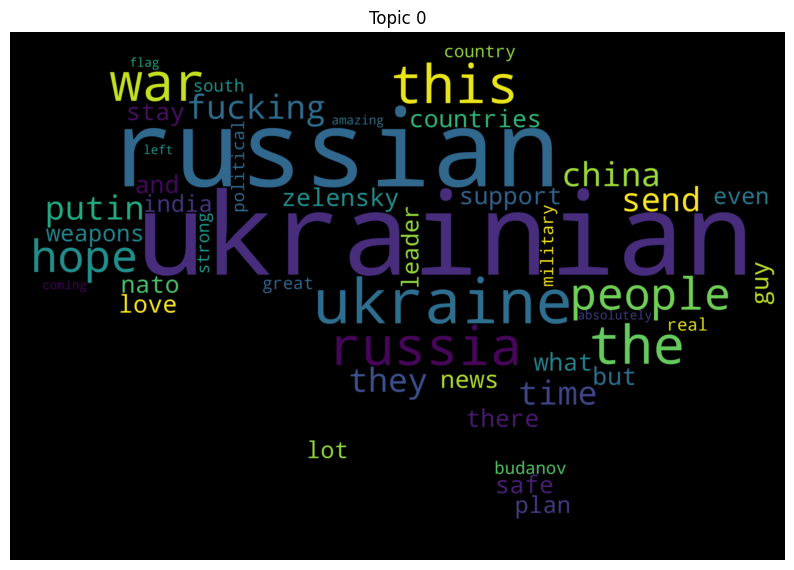

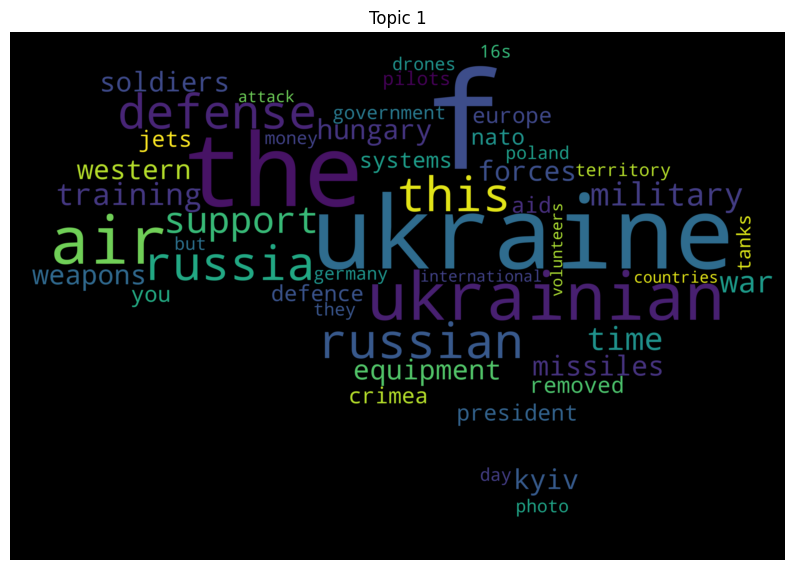

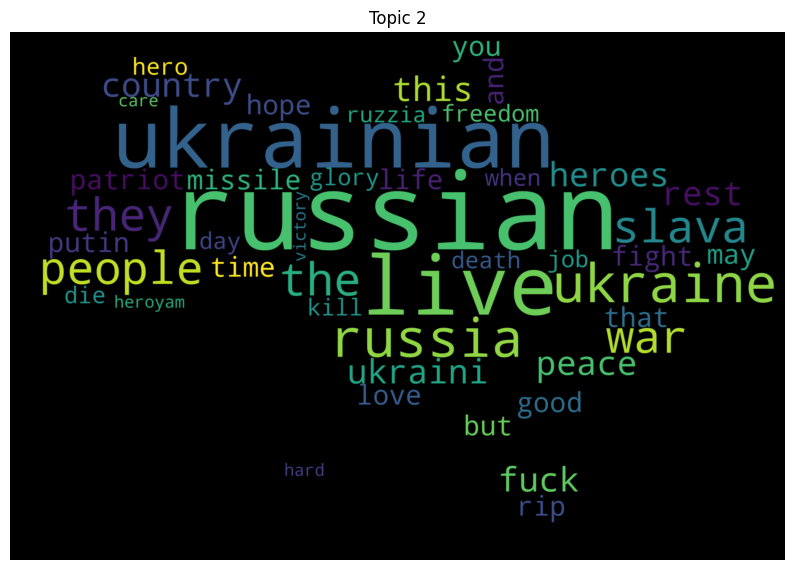

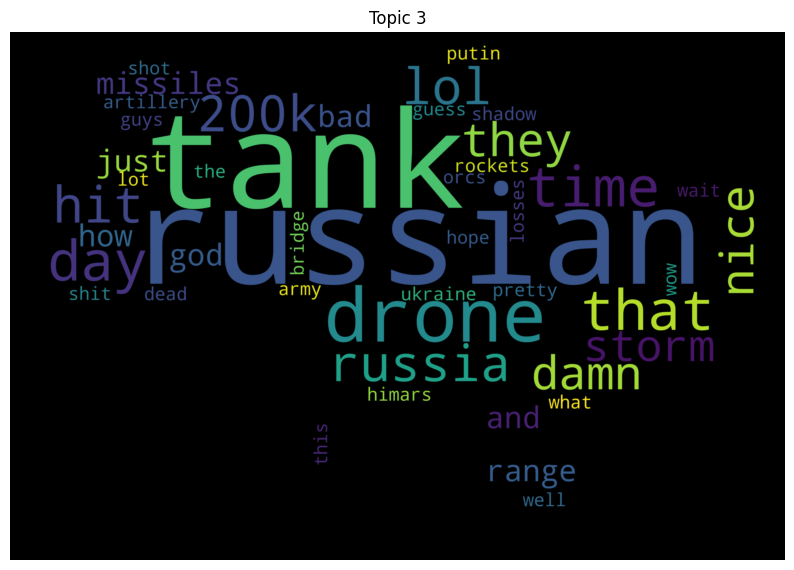

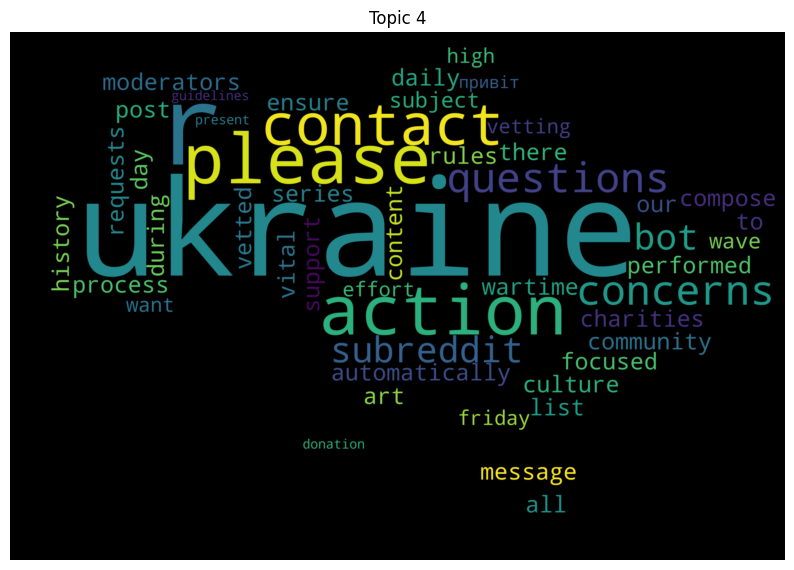

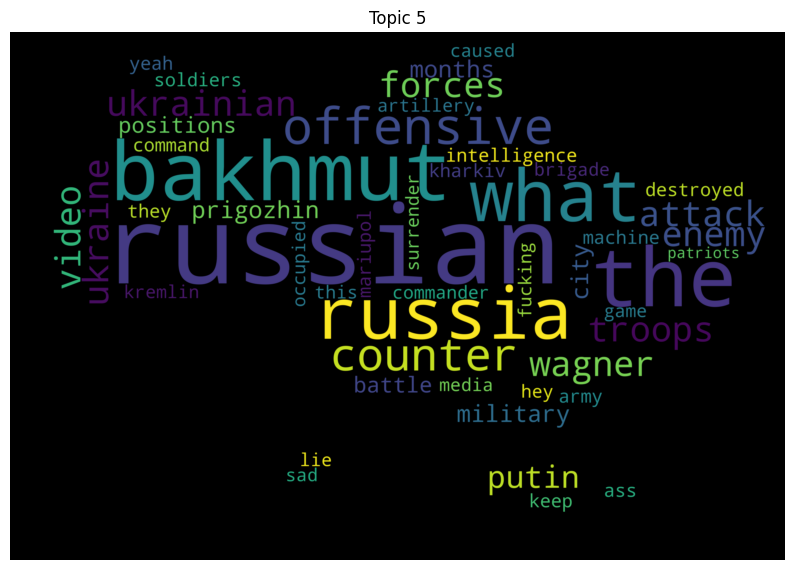

In [5]:
for topic_id, topic_words in lda_model.show_topics(formatted=False, num_words=50):
    # Extraigo las top words de cada topic con su peso
    top_words = [word for word, _ in topic_words]
    # Uno todas las palabras en un string
    wordcloud_text = " ".join(top_words)
    wordcloud = WordCloud(width=800, height=800, background_color="black", stopwords=["u", "_"], mask=mask).generate(wordcloud_text)
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.title(f"Topic {topic_id}")
    plt.axis("off")
    plt.show()

Creo un bigrama con todos los tokens y después un wordcloud con ese bigrama

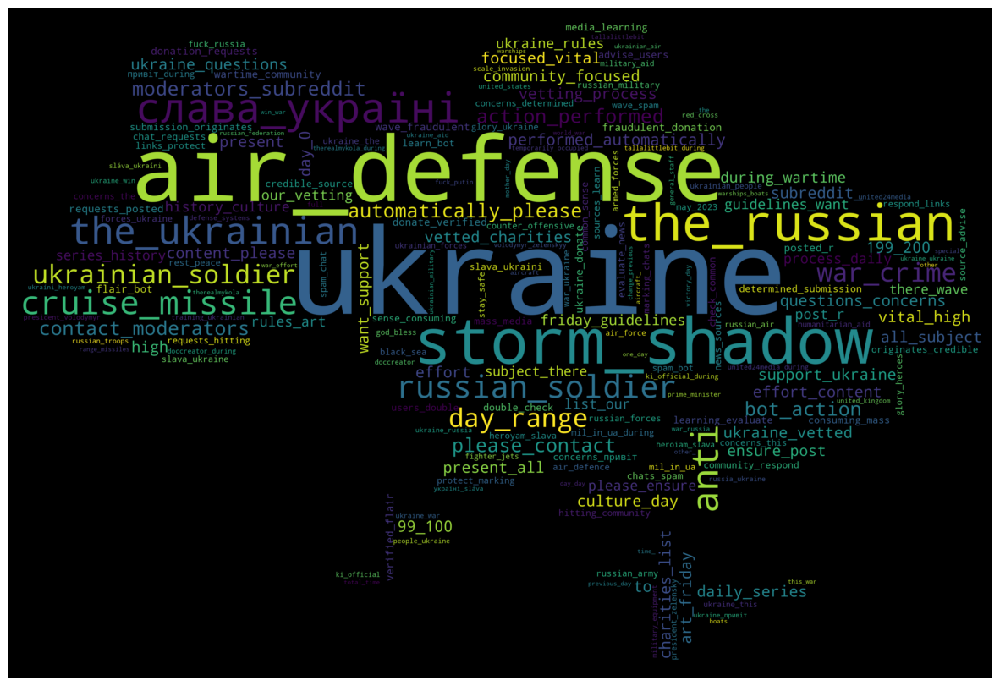

In [6]:
tokens = [token for sublist in data["tokens"] for token in sublist]

# Creo los bigramas
bigram_measures = BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(tokens)
bigrams = finder.nbest(bigram_measures.raw_freq, 500)

# Transformo los bigramas a strings
bigram_strings = ['_'.join(bigram) for bigram in bigrams]

# Genero el wordcloud
wordcloud_text = ' '.join(bigram_strings)

# Al ser datos sacados de un foro donde la gente sube muchas cosas coloquiales y no siempre escrito de la mejor forma hay algunas palabras que se repiten mucho y no aportan nada así que las añado a las stopwords
wordcloud = WordCloud(width=3000, height=3000, background_color="black", stopwords=["u", "_", "img_emote", "compose", "_to", "привіт_u", "d", "r", "t5_2qqcn", "message"], mask=mask)
wordcloud.generate_from_text(wordcloud_text)

# Muestro el wordcloud
plt.figure(figsize=(15, 15))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

current_date = datetime.now().strftime("%Y-%m-%d")
wordcloud.to_file("wordcloud_reddit_"+current_date+".png")

De este wordcloud podemos sacar cosas interesantes que se han hablado ultimamente en el reddit como pueden ser *misiles_crucero* o *air_defense* debido a los ultimos ataque que ha habido a la capital con artilleria y que han defendido con unos sitemas de occidente. Además podemos observar cosas más tipicas como *slava_ukraini* que significa viva Ucrania, lo mismo en ucraniano *Слав_Украïнi*, o por ejemplo con el *rest_peace* por la gente que muere en la guerra. También podemos observar como se refieren a los soldados rusos y ucranianos con *ukrainian_soldier* o *russian_soldier* ya que en estos foros muchas veces se publica material audiovisual sobre situaciones en la guerra y mucha gente en los comentario habla acerca de estos soldados. Otros como *war_crime* también llama la atención.

In [7]:
from nltk.sentiment import SentimentIntensityAnalyzer

nltk.download("vader_lexicon")

# Inicializar el SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

# Crea una nueva columna para las puntuaciones de sentimiento en el dataframe
data["sentiment_score"] = data["tokens"].apply(lambda tokens: sia.polarity_scores(" ".join(tokens))["compound"])

# Clasificar los sentimientos en función de su puntuación
data["sentiment"] = data["sentiment_score"].apply(lambda score: "Positive" if score > 0 else "Negative" if score < 0 else "Neutral")

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\gonibix23\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Boxplot de los scores de los sentimientos, 50% de ellos entre (-0.25, 0.5) mayoritariamente positivos.

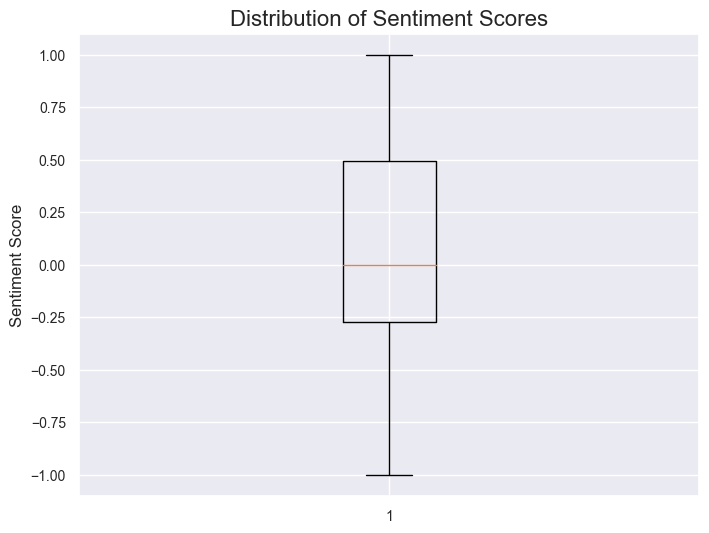

In [8]:
sns.set(style="darkgrid")

# Create a box plot of sentiment scores
plt.figure(figsize=(8, 6))
plt.boxplot(data['sentiment_score'])
plt.title('Distribution of Sentiment Scores', fontsize=16)
plt.ylabel('Sentiment Score', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

## Distribución de los sentimientos

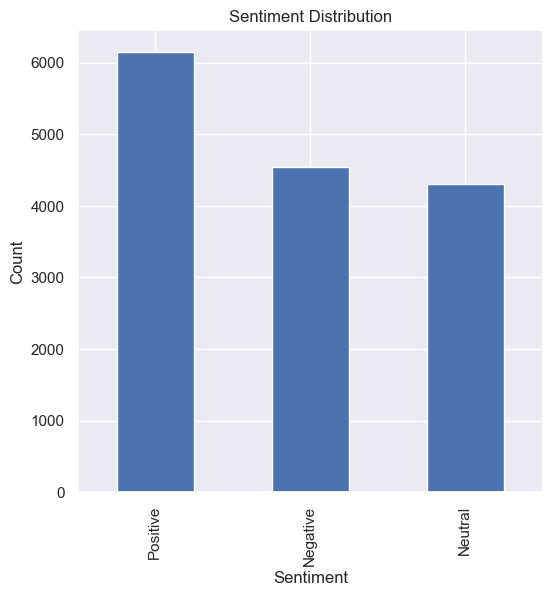

In [9]:
plt.figure(figsize=(6, 6))
data["sentiment"].value_counts().plot(kind="bar")
plt.title("Sentiment Distribution")
plt.xlabel("Sentiment")
plt.ylabel("Count")
plt.show()

## Wordclouds dependiendo del sentimiento del post

Empiezo con el sentimiento negativo y es intersante ver las cosas que aparecen en el wordcloud como Putin, guerra y demás cosas.

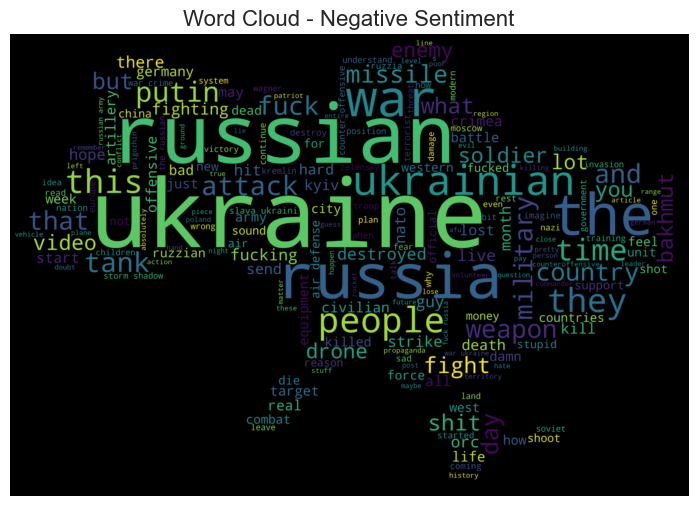

In [10]:
# Filtra las filas negativas del dataframe
negative_rows = data[data["sentiment"] == "Negative"]

negative_text = " ".join([" ".join(tokens) for tokens in negative_rows["tokens"]])

wordcloud = WordCloud(width=1000, height=1000, background_color="black", stopwords=["u", "_", "img_emote", "compose", "_to", "привіт_u", "d", "r", "t5_2qqcn", "message"], mask=mask).generate(negative_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud - Negative Sentiment", fontsize=16)
plt.show()

En el wordcloud de los post positivos he tenido que quitar muchas stopwords de cosas relacionadas con el reddit porque sino no salia nada interesante y aun así tampoco hay muchas cosas que sacar.

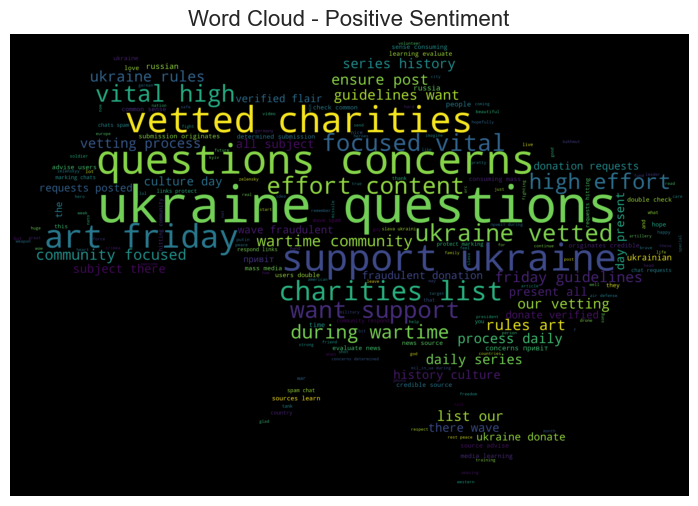

In [11]:
negative_rows = data[data["sentiment"] == "Positive"]

negative_text = " ".join([" ".join(tokens) for tokens in negative_rows["tokens"]])

wordcloud = WordCloud(width=1000, height=1000, background_color="black", stopwords=["u", "_", "img_emote", "compose", "_to", "привіт_u", "d", "r", "t5_2qqcn", "message", "please", "contact", "bot", "to", "action", "performed", "automatically", "moderators", "subreddit"], mask=mask).generate(negative_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud - Positive Sentiment", fontsize=16)
plt.show()

Y el neutral es un poco mezcla de ambos.

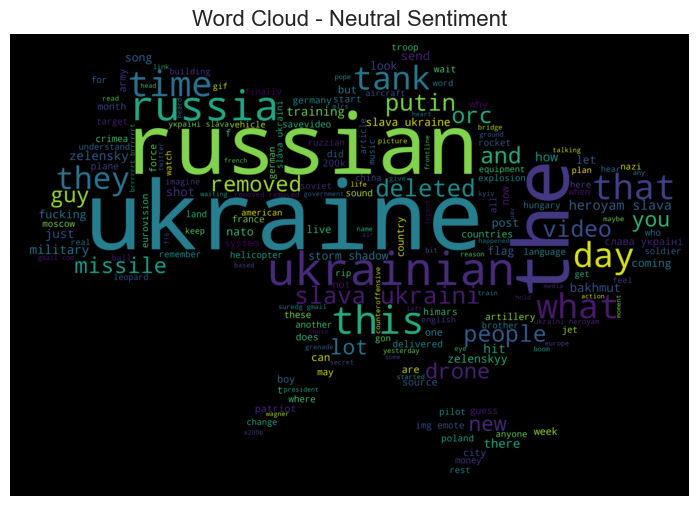

In [12]:
negative_rows = data[data["sentiment"] == "Neutral"]

negative_text = " ".join([" ".join(tokens) for tokens in negative_rows["tokens"]])

wordcloud = WordCloud(width=1000, height=1000, background_color="black", stopwords=["u", "_", "img_emote", "compose", "_to", "привіт_u", "d", "r", "t5_2qqcn", "message"], mask=mask).generate(negative_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud - Neutral Sentiment", fontsize=16)
plt.show()

## Aqui empiezo con la parte de grafos

In [13]:
data["id"] = data["kind"]+"_"+data["id"]
data.drop(["kind"], axis=1, inplace=True)
data.head()

,subreddit,upvote_ratio,ups,downs,score,created_utc,id,parent_id,tokens,sentiment_score,sentiment
0,ukraine,1.00,4,0,4,2023-05-15T02:29:53Z,t3_13hs8ku,0,"[support, probe, russian, war, crimes, within,...",-0.2960,Negative
1,ukraine,1.00,63,0,63,2023-05-15T01:56:53Z,t3_13hrhsr,0,"[france, ukraine, armored, vehicles, light, ta...",0.2732,Positive
2,ukraine,1.00,80,0,80,2023-05-15T01:43:07Z,t3_13hr6gs,0,"[zelenskyy, create, coalition, fighter, jets, ...",0.4019,Positive
3,ukraine,0.99,48,0,48,2023-05-15T01:40:52Z,t3_13hr4nd,0,"[ukrainian, drone-corrected, artillery, pursue...",-0.4939,Negative
4,ukraine,0.99,48,0,48,2023-05-15T01:34:59Z,t3_13hqzqc,0,"[canada, this, you, some, context, province, b...",0.0547,Positive


In [14]:
# Creo un gráfico NetworkX vacío
graph = nx.Graph()

graph.add_edges_from(bigrams)

# Crea una red pyvis
nt = Network(height="1080px", width="100%", notebook=True)

# Añado los nodos y aristas a la red pyvis
for node in graph.nodes:
    node_data = graph.nodes[node]
    nt.add_node(node, **node_data)

for edge in graph.edges:
    edge_data = graph.edges[edge]
    nt.add_edge(edge[0], edge[1], **edge_data)

# Exporto el grafo a un archivo graphml
nx.write_graphml(graph, "word_network.graphml")

## Analisis del grafo (MUUUUUYYYYY INTERESANTE)

El grafo está hecho de tal forma que las uniones dependen de los pesos del bigrama.

Si quieres visualizar el grafo, abre el network.html, es muy interesante.

Se ven cosas muy interesantes como la tendencía de las personas que hablan en el reddit de Ucrania por ejemplo cuando vemos las conexiones a la palabra *russian*

![russians](imagenes_markdown/russians.png)

Podemos observar como todo lo que se habla de los rusos es negativo refieriendose a ocupación, propaganda, destrucción, agresión, invasores.

![war](imagenes_markdown/war.png)

También se puede observar como se relaciona a los rusos con guerra y como se les relaciona con crimenes de guerra o que han empezado la guerra.

![fuck](imagenes_markdown/fuck.png)

O como se relaciona *fuck* solo con Putin y con Rusia como dato curioso/gracioso.

![slava](imagenes_markdown/slava.png) ![slava](imagenes_markdown/slava2.png)

De contra forma que cuando se habla de la palabra *slava* siempre va relacionada a Ucrania, a los ucranianos o a los heroes que en ucraniano se llaman *heroiam/heroyam* al igual que RIP (descanse en paz) solo se menciona para referirse a los soldados ucranianos caidos, los heroes. En la imagen de la derecha es lo mismo pero en ucraniano (слава = slava = viva, украïнi = ukraini = Ucrania)

![priviet](imagenes_markdown/priviet.png)

Aquí se ve con que otros reddits se junta este reddit mediante la palabra привiт que significa hola en ucraniano.

Hay muchisimos más nodos de los que se podrían hablar como el de defensa, que se relaciona con Ucrania y este se relaciona con palabras como entrenamiento (las tropas ucranianas que estan entrenando en paises europeos), inteligencia (por toda las inteligencia que proporcionan los paises europeos para ayudar a Ucrania en el frente), ciudades... Son muy interesantes todos los nodos pero esto se extendería muchisimo si hablase de todo, por eso he hablado de los más importantes que nos dicen la tendencía del foro que se inclina sobre Ucrania y se hablan cosas malas sobre Rusia.

![ukraine](imagenes_markdown/ukraine.png)

Y como era de esperar la palabrá más usada con más conexiones es Ucrania.